# Tutorial on how to work on the dataset

In [1]:
# Import standard libraries
import sys, os, random, shutil
from pathlib import Path
# For audio and MIDI processing
import pretty_midi
import IPython
# For numerical processing
import numpy as np
import torch
# For parallel processing
from multiprocessing import Pool, cpu_count
from tqdm import tqdm
# For statistical analysis
from collections import Counter
# For plotting
import matplotlib.pyplot as plt
# For saving data of segments
import pandas as pd

# Import this project modules
REPO_ROOT = Path('.').resolve().parent
if REPO_ROOT not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))
from src.data.dataset import PianoDataset, MidiPreprocessor
from src.utils.visualization import display_prettymidi
from src.utils.tools import npz_to_midi_file

Tracce da analizzare:

- ../data/clean_midi/883/Hanno ucciso l'uomo ragno.mid
- ../data/clean_midi/883/Grazie mille.mid (**white noise?!** La causa sebra essere la velocity (forza) delle note, ma si può modificare manualmente)
- ../data/clean_midi/Queen/The Miracle.5.mid (alcune canzoni hanno molti strumenti con program number 0)
- ../data/clean_midi/Vasco/Albachiara.mid (Grande spazio senza piano, dovremmo rimuoverlo?)
- ../data/clean_midi/Zappa/Peaches en Regalia.mid (tutti program number 0 ma che rappresentano strumenti differenti)

C:\Users\Andrea\Documents\Università\Magistrale\Deeplearning\NNDL-project\src\utils\visualization.py:24: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(


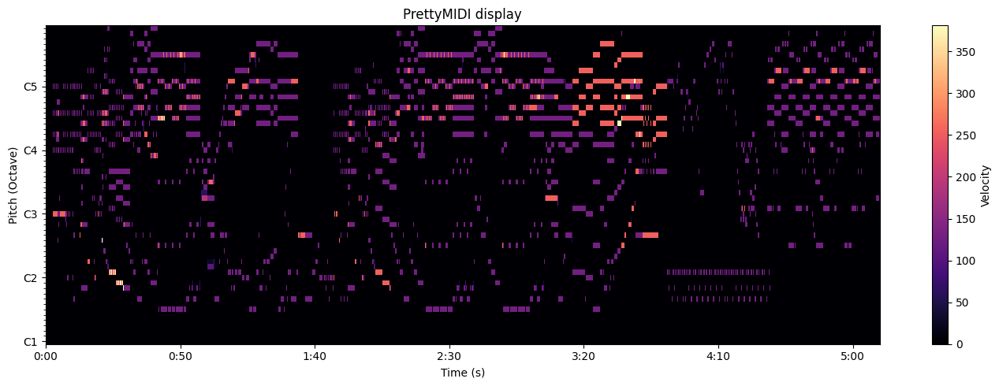

In [2]:
# We'll load in the example.mid file distributed with pretty_midi
pm = pretty_midi.PrettyMIDI("../data/clean_midi/Queen/The Miracle.5.mid")

display_prettymidi(pm, fs=100, pitch_range=(24, 84))

## Instrument composition

Ogni strumento è associato a un program number. I program numbers [0, 1, 2, 3, 4, 5, 6, 7] sono quelli associati al pianoforte. Tuttavia, a volte lo stesso program number può corrispondere a una traccia di batteria, nel qual caso il flag `instr.is_drum` è True.

In [3]:
widths = [14, 25, 27]
print(f'{"Program number":<{widths[0]}} | {"Instrument":<{widths[1]}} | {"Class":<{widths[2]}}')
print('-' * sum(widths))

for i in range(128):
    instrument_name = pretty_midi.program_to_instrument_name(i)
    instrument_class = pretty_midi.program_to_instrument_class(i)
    print(f'{i:<{widths[0]}} | {instrument_name:<{widths[1]}} | {instrument_class:<{widths[2]}}')

Program number | Instrument                | Class                      
------------------------------------------------------------------
0              | Acoustic Grand Piano      | Piano                      
1              | Bright Acoustic Piano     | Piano                      
2              | Electric Grand Piano      | Piano                      
3              | Honky-tonk Piano          | Piano                      
4              | Electric Piano 1          | Piano                      
5              | Electric Piano 2          | Piano                      
6              | Harpsichord               | Piano                      
7              | Clavinet                  | Piano                      
8              | Celesta                   | Chromatic Percussion       
9              | Glockenspiel              | Chromatic Percussion       
10             | Music Box                 | Chromatic Percussion       
11             | Vibraphone                | Chromatic Pe

In [4]:
# print information about each instrument in the MIDI file
for instr in pm.instruments: 
    print(instr)

Instrument(program=0, is_drum=False, name="New Track           ")
Instrument(program=0, is_drum=False, name="Backing Vocals 1    ")
Instrument(program=0, is_drum=False, name="Backing Vocals 2    ")
Instrument(program=0, is_drum=False, name="Guitar 1            ")
Instrument(program=29, is_drum=False, name="Guitar 1            ")
Instrument(program=0, is_drum=False, name="Guitar 2            ")
Instrument(program=0, is_drum=False, name="Guitar 3            ")
Instrument(program=0, is_drum=False, name="Guitar Choir        ")
Instrument(program=0, is_drum=False, name="Keyboard 1 (Harp)   ")
Instrument(program=0, is_drum=False, name="Keyboard 2 (Treble) ")
Instrument(program=0, is_drum=False, name="Keyboard 2 (Bass)   ")
Instrument(program=0, is_drum=False, name="Keyboard 3 (Treble) ")
Instrument(program=0, is_drum=False, name="Keyboard 3 (Bass)   ")
Instrument(program=0, is_drum=False, name="Keyboard 4 (Strings)")
Instrument(program=0, is_drum=False, name="Piano               ")
Instrumen

## How to extract only piano track

In [5]:
piano_instruments = [instr for instr in pm.instruments 
                        if instr.program in [0, 1, 2, 3, 4, 5, 6, 7] and not instr.is_drum and 'Guitar' in instr.name]

# Print selectded piano instruments
for instr in piano_instruments:
    print(instr)

Instrument(program=0, is_drum=False, name="Guitar 1            ")
Instrument(program=0, is_drum=False, name="Guitar 2            ")
Instrument(program=0, is_drum=False, name="Guitar 3            ")
Instrument(program=0, is_drum=False, name="Guitar Choir        ")


[Instrument(program=0, is_drum=False, name="Guitar 1            "), Instrument(program=0, is_drum=False, name="Guitar 2            "), Instrument(program=0, is_drum=False, name="Guitar 3            "), Instrument(program=0, is_drum=False, name="Guitar Choir        ")]


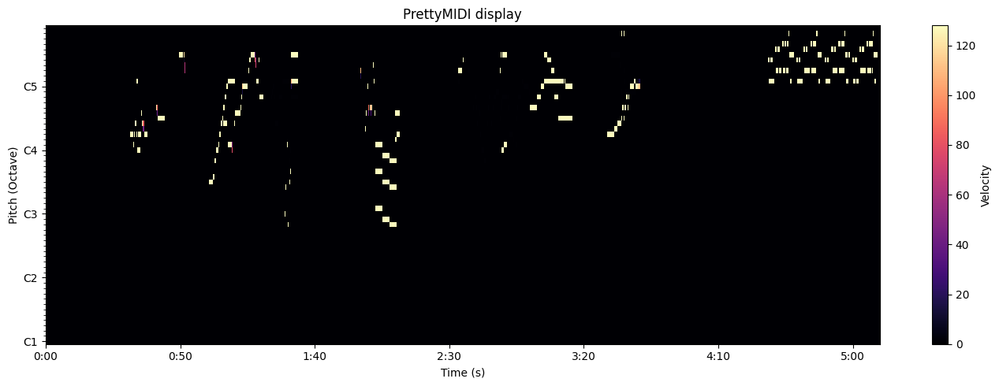

(array([0.]), array([120.]))


In [6]:
pm_piano = pretty_midi.PrettyMIDI()
for piano_instr in piano_instruments:
    pm_piano.instruments.append(piano_instr)

print(pm_piano.instruments)

if len(pm_piano.instruments) != 0:
    display_prettymidi(pm_piano, fs=100, pitch_range=(24, 84))
    audio = IPython.display.Audio(pm_piano.fluidsynth(fs=16000), rate=16000)
    IPython.display.display(audio)

    print(pm_piano.get_tempo_changes())
else:
    print("No piano instruments found in this MIDI file.")

## Extract midi file in matrix form

Il piano roll ha le seguenti caratteristiche:

- 128 righe che corrispondono alle note MIDI totali e colonne che rappresentano intervalli temporali.
- Ogni riga corrisponde a una nota MIDI specifica (tutti i 12 semitoni su più ottave).
- Il valore in ogni cella indica velocità (velocity) della nota.
- Permette la ricostruzione precisa e dettagliata della melodia, durata e dinamica delle note.

In [7]:
fs = 100  # sampling rate per second

piano_roll = pm_piano.get_piano_roll(fs)

print("Piano-roll shape:", piano_roll.shape)
n_pitches, n_frames = piano_roll.shape
duration_seconds = n_frames / fs
print(f"Duration (s): {duration_seconds:.2f}, frames: {n_frames}, fs: {fs}")

np.set_printoptions(threshold=sys.maxsize, linewidth=sys.maxsize )
print(piano_roll[:, fs*50:51*fs])
np.set_printoptions()

Piano-roll shape: (128, 30992)
Duration (s): 309.92, frames: 30992, fs: 100
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000

## Pretty_midi --> matrix (parallel processing for whole dataset)

Poichè trasformare un file midi in una matrice non è computazionalmente semplice se bisogna farlo su migliaia di file, conviene preprocessare prima del training ogni file midi e salvare i risultati in una cartella.
Per rendere il processo ancora più efficiente questo procedimento viene eseguito in parallelo su tutti i core disponibili della cpu.
Al momento quello che viene fatto è:

1. da ciascun file MIDI vengono separate le tracce al piano
2. viene suddiviso in sezioni a bpm costante
3. per ciascuna di queste viene estratto un piano-roll
4. il piano roll viene segmentato in porzioni di lunghezza 128 battiti che corrispondono a 8 bars in 4/4

Ogni segmento viene salvato in una versione sparsa e compattata in un file .npz.
Per modificare il preprocessing modificare `MidiPreprocessor`.

In [8]:
clean_midi_path = REPO_ROOT / 'data' / 'prove'
save_path = REPO_ROOT / 'data' / 'processed_npz'
processing_results_path = REPO_ROOT / 'data' / 'processing_results_details.txt'
segments_details_path = REPO_ROOT / 'data' / 'segments_metadata.txt'

# Solves problem "Adventures of Stevie V." (path with final dot)
if os.name == 'nt':
    clean_midi_path = Path(f"\\\\?\\{str(clean_midi_path.resolve())}")

# Get list of all MIDI files
midi_files = list(clean_midi_path.rglob('*.mid'))

selected_instruments = range(8)  # Piano and related instruments

Questa cella si può saltare se il preprocessing è già stato fatto.

In [9]:
# Clean the whole directory
shutil.rmtree(save_path)
save_path.mkdir(parents=True, exist_ok=True)
(save_path / '.gitkeep').touch()

# Initialize Stats
valid_source_files = 0
total_segments = 0
error_counts = Counter()
detailed_errors = []

# Initialize Processor
processor = MidiPreprocessor(
    select_instruments=selected_instruments, 
    note_start=24, 
    note_end=84, 
    output_dir=save_path,
)

print(f"Starting preprocessing. Metadata will be written in real-time to: {segments_details_path}")

# --- CORE LOGIC ---
with open(segments_details_path, 'w') as f_meta:
    # Write the header
    f_meta.write("filename\tinstrument\tfs\tbpm\n")

    # Start the process Pool
    with Pool(processes=cpu_count()) as pool:
        
        # process files in parallel with imap_unordered for streaming results
        iterator = pool.imap_unordered(processor, midi_files, chunksize=10)
        for result in tqdm(iterator, total=len(midi_files), desc="Processing & Streaming", ncols=150):

            # Positive result analysis
            if isinstance(result, list):
                valid_source_files += 1
                total_segments += len(result)
                # Immediate writing to disk
                for seg in result:
                    f_meta.write(f"{seg['filename']}\t{seg['instrument']}\t{seg['fs']:.2f}\t{seg['bpm']:.2f}\n")
            # Error storage
            elif isinstance(result, str):
                if result.startswith("ERROR"):
                    error_counts["Exception"] += 1
                    detailed_errors.append(result)
                elif result.startswith("DISCARDED"):
                    if "NO PIANO" in result:
                        error_counts["No Piano"] += 1
                    elif "NO VALID SEGMENTS" in result:
                        error_counts["Segment Invalid"] += 1
                    else:
                        error_counts["Other Discard"] += 1

# Save results and stats
with open(processing_results_path, 'w') as f:
    f.write("="*50 + "\n")
    f.write(f"{'REPORT PREPROCESSING':^50}" + "\n")
    f.write("="*50 + "\n\n")

    f.write(f"{'Total files processed:':<35}{len(midi_files):>15}\n")
    f.write(f"{'Of which valid source files:':<35}{valid_source_files:>15}\n")
    f.write(f"{'Discarded files (No Piano):':<35}{error_counts['No Piano']:>15}\n")
    f.write(f"{'Discarded files (Invalid Segments):':<35}{error_counts['Segment Invalid']:>15}\n")
    f.write(f"{'Errors (Exceptions):':<35}{error_counts['Exception']:>15}\n\n")
    f.write(f"{'Total segments created:':<35}{total_segments:>15}\n\n")

    f.write(f"{' Error Details ':=^50}" + "\n\n")
    for error in detailed_errors:
        f.write(error + "\n")

Starting preprocessing. Metadata will be written in real-time to: C:\Users\Andrea\Documents\Università\Magistrale\Deeplearning\NNDL-project\data\segments_metadata.txt


Processing & Streaming: 100%|███████████████████████████████████████████████████████████████████████████████████████| 299/299 [00:19<00:00, 15.32it/s]


               REPORT PREPROCESSING

Total files processed:                         299
Of which valid source files:                   203
Discarded files (No Piano):                     89
Discarded files (Invalid Segments):              7
Errors (Exceptions):                             0

Total segments created:                       2191

================= Error Details ==================



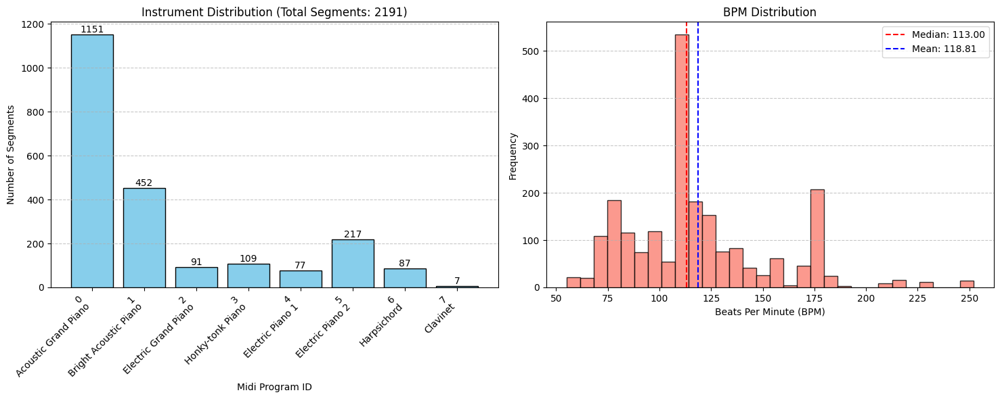

In [10]:
try:
    with open(REPO_ROOT / 'data' / 'processing_results_details.txt', 'r') as f:
        for _ in range(20):
            line = f.readline()
            if not line:
                break
            print(line.rstrip())

except FileNotFoundError:
    print(f"File non trovato: {REPO_ROOT / 'data' / 'processing_results_details.txt'}")
    
try:
    df_analysis = pd.read_csv(segments_details_path, sep='\t')
    df_analysis = df_analysis.set_index('filename')

    # Extraction data from columns
    instruments = df_analysis['instrument'].values
    bpms = df_analysis['bpm'].values

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # --- Histogram Instruments ---
    instr_counts = Counter(instruments)
    
    # Identify present instruments
    present_instrs = sorted(list(instr_counts.keys()))
    counts = [instr_counts[i] for i in present_instrs]
    # Obtain readable names
    instr_labels = [pretty_midi.program_to_instrument_name(int(i)) for i in present_instrs]
    
    # Display Bars
    bars = ax1.bar([str(i) for i in present_instrs], counts, color='skyblue', edgecolor='black')
    ax1.set_title(f'Instrument Distribution (Total Segments: {len(df_analysis)})')
    ax1.set_xlabel('Midi Program ID')
    ax1.set_ylabel('Number of Segments')
    # Customize x-ticks with instrument names
    ax1.set_xticks(range(len(present_instrs)))
    ax1.set_xticklabels([f"{i}\n{l}" for i, l in zip(present_instrs, instr_labels)], rotation=45, ha='right')
    ax1.grid(axis='y', linestyle='--', alpha=0.7)
    # Add value labels above bars
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height, f'{int(height)}', ha='center', va='bottom')

    # --- Histogram BPM ---
    ax2.hist(bpms, bins=30, color='salmon', edgecolor='black', alpha=0.8)
    ax2.set_title('BPM Distribution')
    ax2.set_xlabel('Beats Per Minute (BPM)')
    ax2.set_ylabel('Frequency')
    ax2.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Statistics
    median_bpm = np.median(bpms)
    mean_bpm = np.mean(bpms)
    
    ax2.axvline(median_bpm, color='red', linestyle='dashed', linewidth=1.5, label=f'Median: {median_bpm:.2f}')
    ax2.axvline(mean_bpm, color='blue', linestyle='dashed', linewidth=1.5, label=f'Mean: {mean_bpm:.2f}')
    ax2.legend()

    plt.tight_layout()
    plt.show()

except FileNotFoundError:
    print("ERROR: File non trovato. Esegui prima il salvataggio.")

## Matrix --> Pretti_midi

Il procedimento inverso al precedente è più complicato. Attraverso la funzione `npz_to_midi_file` viene eseguita la conversione, ho copiato da: [examples directory](https://github.com/craffel/pretty-midi/tree/master/examples).

Visualizing random segment: Queen__We_Are_The_Champions.8_instr0_ts101.05_te121.11_fs6.33.npz
Sampling Frequency: 6.33 Hz


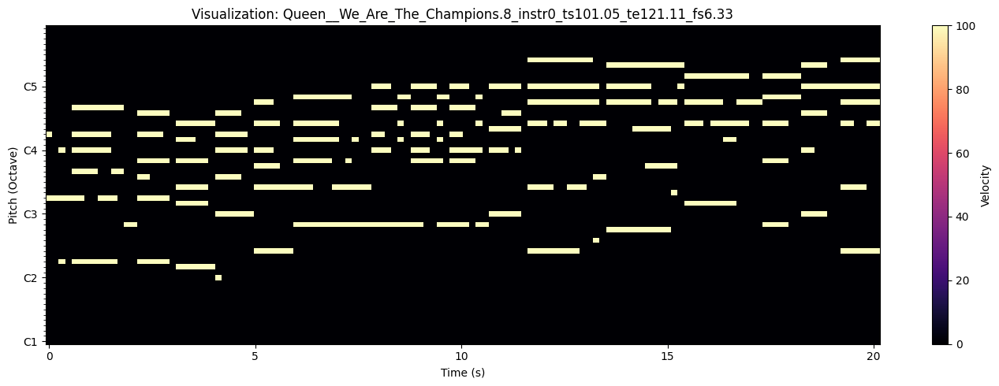

In [14]:
npz_files = list(save_path.glob('*.npz'))

if not npz_files:
    print("Nessun file trovato! Controlla il percorso.")
else:
    random_file = random.choice(npz_files)

    print(f"Visualizing random segment: {random_file.name}")
    fs_value = df_analysis.loc[random_file.name, 'fs']
    print(f"Sampling Frequency: {fs_value} Hz")

    random_pm = npz_to_midi_file(random_file, note_start=24, fs=fs_value)
    for instr in random_pm.instruments:
        for note in instr.notes:
            note.velocity = 100  # Set a fixed velocity for better audio output

    display_prettymidi(
        random_pm, 
        fs=fs_value, 
        pitch_range=(24, 84),
        title=f"Visualization: {random_file.stem}"
    )
    audio = IPython.display.Audio(random_pm.fluidsynth(fs=16000), rate=16000)
    IPython.display.display(audio)


## Load the datasets

In [12]:
train_size = int(0.8 * len(npz_files))
val_size = len(npz_files) - train_size
train_paths, val_paths = torch.utils.data.random_split(npz_files, [train_size, val_size])

train_dataset = PianoDataset(train_paths)
val_dataset = PianoDataset(val_paths)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)